In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tabular-playground-series-may-2022/sample_submission.csv
/kaggle/input/tabular-playground-series-may-2022/train.csv
/kaggle/input/tabular-playground-series-may-2022/test.csv


In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


2022-05-25 17:32:10.142596: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-25 17:32:10.261229: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-25 17:32:10.261981: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [3]:
df_train = pd.read_csv('/kaggle/input/tabular-playground-series-may-2022/train.csv')
df_test = pd.read_csv('/kaggle/input/tabular-playground-series-may-2022/test.csv')

In [4]:
df_train.info()
target=df_train['target']
#F27 is character values, lets try training without it.
df_train.drop(['f_27','target'],axis = 1,inplace=True)
features = df_train.iloc[:,1:31]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900000 entries, 0 to 899999
Data columns (total 33 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      900000 non-null  int64  
 1   f_00    900000 non-null  float64
 2   f_01    900000 non-null  float64
 3   f_02    900000 non-null  float64
 4   f_03    900000 non-null  float64
 5   f_04    900000 non-null  float64
 6   f_05    900000 non-null  float64
 7   f_06    900000 non-null  float64
 8   f_07    900000 non-null  int64  
 9   f_08    900000 non-null  int64  
 10  f_09    900000 non-null  int64  
 11  f_10    900000 non-null  int64  
 12  f_11    900000 non-null  int64  
 13  f_12    900000 non-null  int64  
 14  f_13    900000 non-null  int64  
 15  f_14    900000 non-null  int64  
 16  f_15    900000 non-null  int64  
 17  f_16    900000 non-null  int64  
 18  f_17    900000 non-null  int64  
 19  f_18    900000 non-null  int64  
 20  f_19    900000 non-null  float64
 21  f_20    90

In [5]:
from sklearn.model_selection import train_test_split
X=features
y=np.ravel(target)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42) 

In [6]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)  

X_train.shape

(603000, 30)

In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

tf.debugging.set_log_device_placement(True)

model = Sequential()
model.add(Dense(30, activation='relu', input_shape=(30,)))
model.add(Dense(30, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
optimizer='sgd',
metrics=['accuracy'])
model.fit(X_train, y_train,epochs=5, verbose=1)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job

2022-05-25 17:32:24.955819: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-25 17:32:24.956334: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-25 17:32:24.957177: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-25 17:32:24.957818: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapData

2022-05-25 17:32:27.745680: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-05-25 17:32:27.748525: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:27.748581: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:27.748655: I tensorflow/core/common_runtime/placer.cc:114] RandomShuffle: (RandomShuffle): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:27.748680: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:27.748694: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:27.748708: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/ta

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/devic

2022-05-25 17:32:28.121313: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:28.121362: I tensorflow/core/common_runtime/placer.cc:114] iterator_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:32:28.121375: I tensorflow/core/common_runtime/placer.cc:114] sequential_dense_matmul_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2022-05-25 17:32:28.121386: I tensorflow/core/common_runtime/placer.cc:114] sequential_dense_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2022-05-25 17:32:28.121396: I tensorflow/core/common_runtime/placer.cc:114] sequential_dense_1_matmul_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2022-05-25 17:32:28.121406: I tensorflow/core/common_runtime/placer.cc:114] sequential_dense_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
20

    1/18844 [..............................] - ETA: 7:07:44 - loss: 0.9122 - accuracy: 0.4062Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_600 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __i

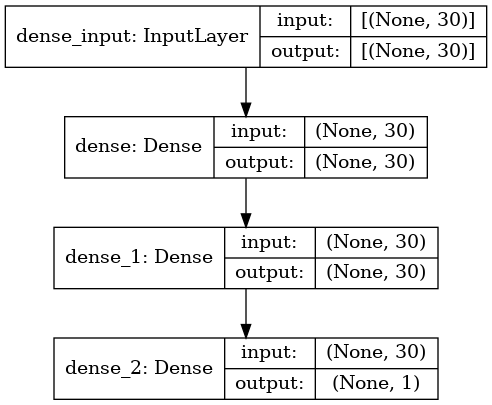

In [8]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='/tmp/model.png', show_shapes=True,)

In [9]:
y_pred = model.predict(X_test)
y_pred
np.argmax(y_pred,axis=1)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2022-05-25 17:39:12.970614: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970672: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970693: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970706: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970719: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970732: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:12.970744: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-

Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_189141 in device /job:

array([0, 0, 0, ..., 0, 0, 0])

In [10]:
score = model.evaluate(X_test, y_test,verbose=1)
print(score)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapData

2022-05-25 17:39:47.469271: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.469900: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.470028: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.470236: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.470440: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.470659: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:39:47.470884: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-

Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
  17/9282 [..............................] - ETA: 30s - loss: 0.4359 - accuracy: 0.8180  Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_198590 in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

In [11]:
df_test = pd.read_csv('/kaggle/input/tabular-playground-series-may-2022/test.csv')
df_test.drop(['f_27'],axis = 1,inplace=True)
features_test = df_test.iloc[:,1:31]
X_submissions =  scaler.transform(features_test)
y_submissions = model.predict(X_submissions)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2022-05-25 17:40:37.413307: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413364: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413383: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413396: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413409: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413471: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-05-25 17:40:37.413490: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-

Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_217231 in device /job:

In [12]:
y_submissions[1][0]

0.9349139

In [13]:
import csv
with open('submission.csv', 'w') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['id', 'target'])
    for i,v in enumerate(y_submissions):
        csvwriter.writerow([i+900000,str(v[0])])